# Classificação de ligas e resultados por eventos em jogos de futebol

- Gustavo Magalhães - FEUP - Porto, Portugal - up201705072@fe.up.pt
- Nuno Cardoso - FEUP - Porto, Portugal - up201706162@fe.up.pt
- Tiago Silva - FEUP - Porto, Portugal - up201705985@fe.up.pt

**O futebol, o jogo mais popular do planeta, disputa-se por 2 equipas de 11 elementos num campo retangular com duas balizas em cada lado,  onde ganha equipa a marcar mais, pontos, movendo uma bola até a baliza adversária. É naturalmente um disporto técnico e fisico, recompensado por norma a equipa em melhor forma, não deixando de parte o fator sorte. Como estas partidas se disputam no decorrer de 90 minutos divididos em duas partes de 45 minutos, vários eventos são gerados nesse tempo, sendo estes remates, faltas, golos entre outros que acreditamos serem essenciais quando se dita o resultado final e o próprio estilo de jogo tático adotado. É com base nesta informação que iremos tentar classificar os paises em que estas partidas se disputam, e até mesmo prever o resultado final.**

## I. Introdução 

O documento apresentado, no âmbito da unidade curricular de Inteligência Artificial, tem como objetivo a exploração de uma base de dados com vários eventos decorridos em jogos de futebol nas principais ligas europeias, usando para isso aprendizagem supervisionada por classificação. São objetivos deste trabalho, tanto a avaliação da base de dados para escolha de classes e geração do dataset, como também a aplicacçao de algoritmos a aplicar neste tipo de problemas e a sua análise. 

No presento trabalho a decisão tomada passou por organizar datasets contando as repetições de eventos distintos ocorrentes num jogo de futebol, para assim classificar qual o país onde o jogo está a ser disputado, ou o resultado final. Quanto aos algortimos, àrvores de decisão, redes neuronais artificiais e k-vizinho mais próximo foram os escolhidos.

## II. Descrição do Problema

Dado a base de dados analisade possuir bastante colunas e por cada jogo gerar em média 100 eventos, decidimos desde já nos nossos datasets agrupar todos os eventos de um jogo numa linha apenas, para isso contando o numero de ocorrências de cada tipo de evento registando. 

Dado alguma indecisão, gerada pela dificuldade em saber quais as melhores classes a usar, dividimos o tema em 2 classificações possiveis, classificar países e classificar resultados. Para que isso fosse possivel, percorrendo a nossa base de dados com um programa por nós implementado [1], geramos então os seguintes datasets:

- Para se classificar o país onde ocorre o jogo, agrupamos os eventos de cada jogo contando o número de ocorrências de golos, faltas, cartões, penáltis, cantos, contra-ataques e número de vezes em que se rematou a bola numa dada zona do campo;

- Para se classificar o vencedor do jogo ou empate, agrupamos os eventos de cada jogo contando número de faltas, cartões, penáltis, cantos, contra-ataques e número de remates de uma dada zona do campo, isto tanto para a equipa da casa como a visitante, com a particularidade de se ignorarem os golos mar.
 

In [4]:
#imports used 
import pandas as pd
import numpy as np

# This line tells the notebook to show plots inside of the notebook
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sb

### Classificação por país 

In [5]:
#read csv file for country classification considering possible na values
country_data = pd.read_csv('gameEvents.csv', na_values=['NA'])
country_data.describe()

,goal,foul,corner,offside,yellow_card,red_card,penalty,fastbreak,attempt_1,attempt_2,...,attempt_10,attempt_11,attempt_12,attempt_13,attempt_14,attempt_15,attempt_16,attempt_17,attempt_18,attempt_19
count,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.0,9073.0,...,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000
mean,2.694258,25.668798,10.051251,4.790918,4.409457,0.137992,0.298027,0.505676,0.0,0.0,...,0.384768,2.032514,0.377604,0.734046,0.286013,10.322165,0.219442,0.218009,0.028216,0.159815
std,1.681543,6.396077,3.408821,2.596853,2.267054,0.390760,0.622206,0.782156,0.0,0.0,...,0.636190,1.477991,0.619204,0.908711,0.540347,3.679051,0.487508,0.495880,0.170840,0.407474
min,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,21.000000,8.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,1.000000,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,25.000000,10.000000,4.000000,4.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,2.000000,0.000000,1.000000,0.000000,10.000000,0.000000,0.000000,0.000000,0.000000
75%,4.000000,30.000000,12.000000,6.000000,6.000000,0.000000,0.000000,1.000000,0.0,0.0,...,1.000000,3.000000,1.000000,1.000000,0.000000,13.000000,0.000000,0.000000,0.000000,0.000000
max,12.000000,51.000000,26.000000,21.000000,15.000000,4.000000,5.000000,5.000000,0.0,0.0,...,5.000000,10.000000,4.000000,6.000000,4.000000,28.000000,4.000000,6.000000,2.000000,9.000000


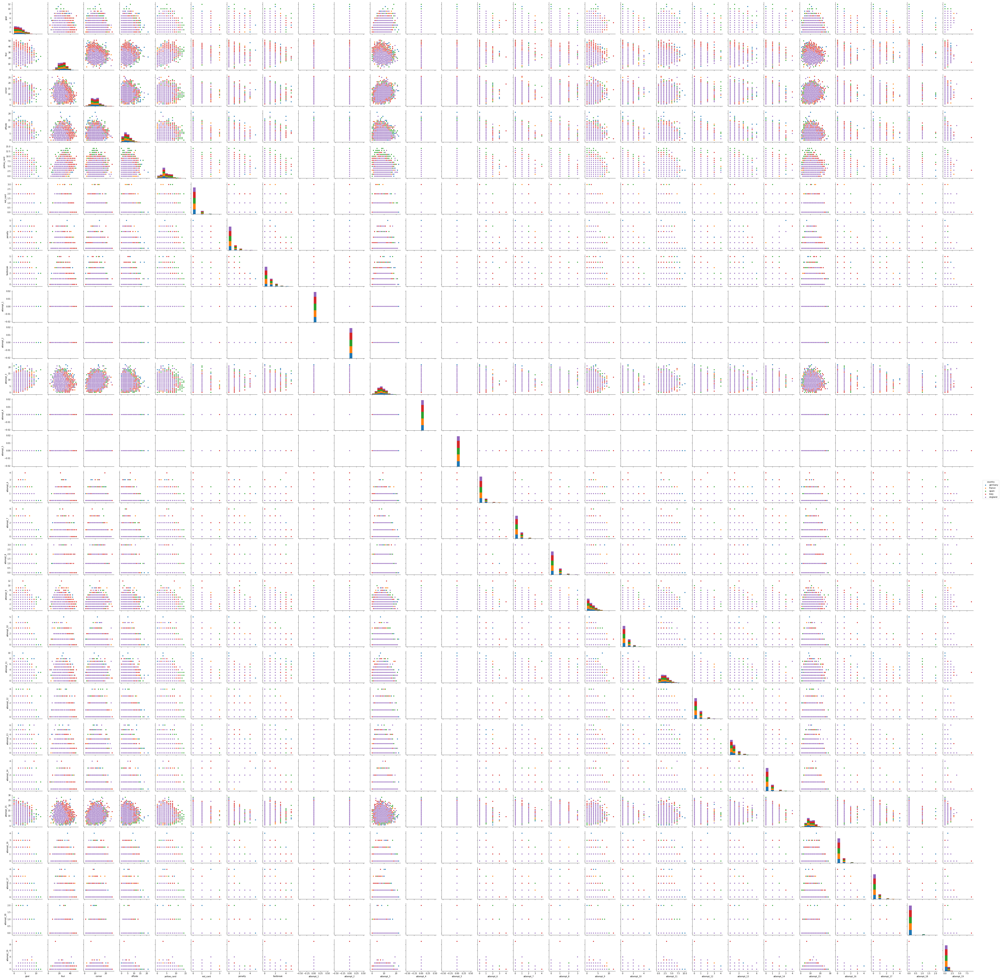

In [3]:
#plotting 
sb.pairplot(country_data.dropna(), hue='country')

In [6]:
country_data = country_data.drop(['attempt_1', 'attempt_2', 'attempt_4', 'attempt_5'], axis=1)
country_data = country_data.dropna()
country_data.describe()

,goal,foul,corner,offside,yellow_card,red_card,penalty,fastbreak,attempt_3,attempt_6,...,attempt_10,attempt_11,attempt_12,attempt_13,attempt_14,attempt_15,attempt_16,attempt_17,attempt_18,attempt_19
count,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,...,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000
mean,2.696453,25.534412,10.033230,4.745364,4.402489,0.135283,0.297449,0.491350,7.704045,0.163783,...,0.383696,2.038706,0.383074,0.741008,0.286497,10.276540,0.213566,0.213566,0.027878,0.164032
std,1.689438,6.383882,3.408028,2.584374,2.253433,0.384856,0.626076,0.769902,3.060754,0.416019,...,0.635642,1.476939,0.621667,0.912533,0.542274,3.670244,0.479285,0.485734,0.168371,0.414422
min,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,21.000000,8.000000,3.000000,3.000000,0.000000,0.000000,0.000000,6.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,25.000000,10.000000,4.000000,4.000000,0.000000,0.000000,0.000000,7.000000,0.000000,...,0.000000,2.000000,0.000000,1.000000,0.000000,10.000000,0.000000,0.000000,0.000000,0.000000
75%,4.000000,30.000000,12.000000,6.000000,6.000000,0.000000,0.000000,1.000000,10.000000,0.000000,...,1.000000,3.000000,1.000000,1.000000,0.000000,13.000000,0.000000,0.000000,0.000000,0.000000
max,12.000000,51.000000,26.000000,21.000000,14.000000,3.000000,5.000000,5.000000,22.000000,4.000000,...,5.000000,10.000000,4.000000,6.000000,4.000000,28.000000,4.000000,4.000000,2.000000,9.000000


De modo a que o conjunto de dados contenha apenas informação relevante foram removidas 4 colunas a tabela, attempt1, 
attempt2, attempt4 e attempt5 visto que todas elas apresentaram uma contagem total de 0 e, por isso, não trariam vantagens na obtenção do algoritmo de classificação podendo até dificultar este processo.

Para além disso, foram removidas todas as linhas onde não foi encontrada nos fichieros de dados iniciais a liga à qual o jogo pertence, por não haver um método adequado de correção destas linhas e que as pudesse tornar úteis.

#### Dados limpos

In [7]:
country_data.to_csv('gameEvents_clean.csv', index=False)

In [5]:
#read csv file for country classification
country_data_clean = pd.read_csv('gameEvents_clean.csv')
country_data_clean.describe()

,goal,foul,corner,offside,yellow_card,red_card,penalty,fastbreak,attempt_3,attempt_6,...,attempt_10,attempt_11,attempt_12,attempt_13,attempt_14,attempt_15,attempt_16,attempt_17,attempt_18,attempt_19
count,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,...,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000,8035.000000
mean,2.696453,25.534412,10.033230,4.745364,4.402489,0.135283,0.297449,0.491350,7.704045,0.163783,...,0.383696,2.038706,0.383074,0.741008,0.286497,10.276540,0.213566,0.213566,0.027878,0.164032
std,1.689438,6.383882,3.408028,2.584374,2.253433,0.384856,0.626076,0.769902,3.060754,0.416019,...,0.635642,1.476939,0.621667,0.912533,0.542274,3.670244,0.479285,0.485734,0.168371,0.414422
min,0.000000,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,21.000000,8.000000,3.000000,3.000000,0.000000,0.000000,0.000000,6.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,25.000000,10.000000,4.000000,4.000000,0.000000,0.000000,0.000000,7.000000,0.000000,...,0.000000,2.000000,0.000000,1.000000,0.000000,10.000000,0.000000,0.000000,0.000000,0.000000
75%,4.000000,30.000000,12.000000,6.000000,6.000000,0.000000,0.000000,1.000000,10.000000,0.000000,...,1.000000,3.000000,1.000000,1.000000,0.000000,13.000000,0.000000,0.000000,0.000000,0.000000
max,12.000000,51.000000,26.000000,21.000000,14.000000,3.000000,5.000000,5.000000,22.000000,4.000000,...,5.000000,10.000000,4.000000,6.000000,4.000000,28.000000,4.000000,4.000000,2.000000,9.000000


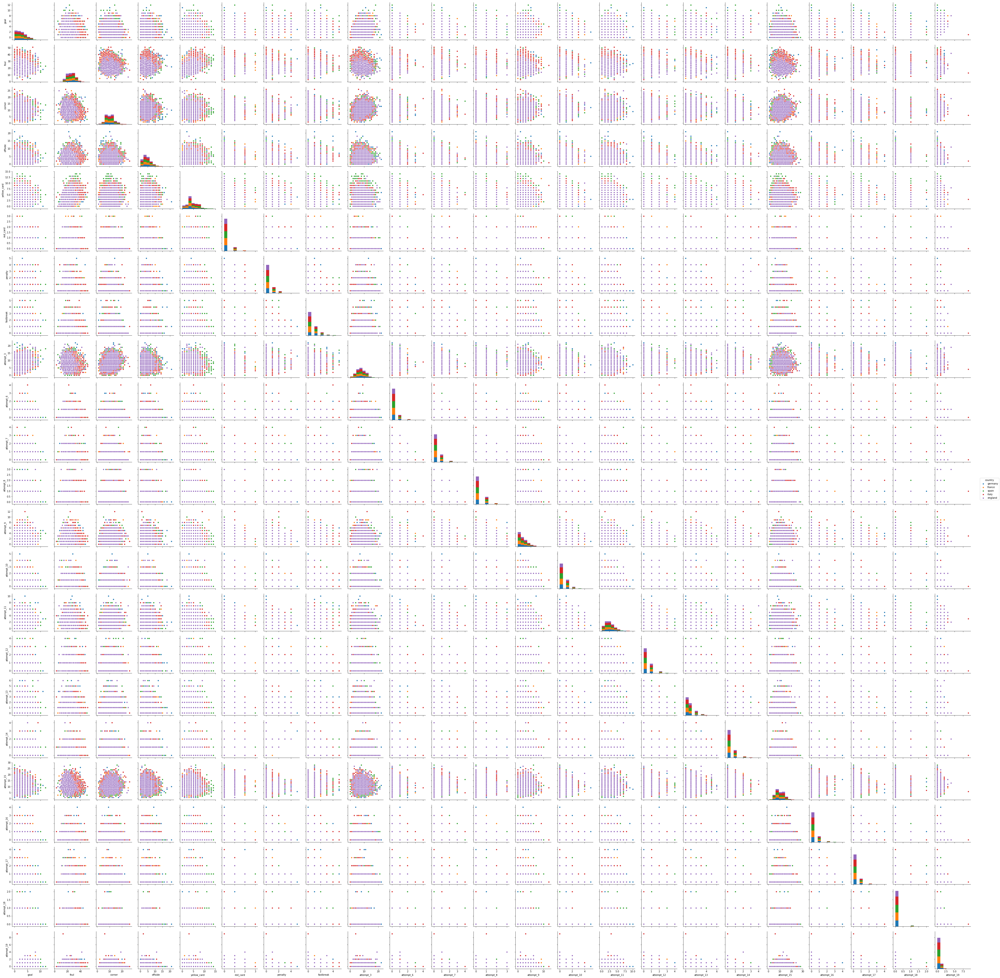

In [7]:
#plotting 
sb.pairplot(country_data_clean, hue='country')

### Classificação por vencedor 

In [9]:
#read csv file for country classification considering possible na values
winner_data = pd.read_csv('gameEvents[HomeAway].csv', na_values=['NA'])
winner_data.describe()

,home_foul,home_corner,home_offside,home_yellow_card,home_red_card,home_penalty,home_fastbreak,home_attempt_1,home_attempt_2,home_attempt_3,...,away_attempt_11,away_attempt_12,away_attempt_13,away_attempt_14,away_attempt_15,away_attempt_16,away_attempt_17,away_attempt_18,away_attempt_19,winner
count,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.0,9073.0,9073.000000,...,9073.000000,9073.000000,9073.00000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000
mean,12.684007,5.650942,2.514494,2.035380,0.060399,0.175025,0.267828,0.0,0.0,4.364929,...,0.916676,0.162019,0.29968,0.115948,4.714758,0.106249,0.112421,0.015651,0.068665,1.029428
std,4.128249,2.921888,1.917625,1.410688,0.249978,0.425704,0.574017,0.0,0.0,2.507192,...,1.001047,0.406602,0.58212,0.337935,2.642412,0.338188,0.346838,0.126763,0.267307,0.733215
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10.000000,4.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.0,3.000000,...,0.000000,0.000000,0.00000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,12.000000,5.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.0,0.0,4.000000,...,1.000000,0.000000,0.00000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,15.000000,7.000000,4.000000,3.000000,0.000000,0.000000,0.000000,0.0,0.0,6.000000,...,1.000000,0.000000,0.00000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,29.000000,21.000000,14.000000,9.000000,3.000000,3.000000,4.000000,0.0,0.0,19.000000,...,7.000000,3.000000,5.00000,3.000000,18.000000,3.000000,6.000000,2.000000,6.000000,2.000000


In [9]:
#plotting
sb.pairplot(winner_data.dropna(),hue='winner')

In [10]:
winner_data = winner_data.drop(['home_attempt_1', 'home_attempt_2', 'home_attempt_4', 'home_attempt_5'], axis=1)
winner_data = winner_data.drop(['away_attempt_1', 'away_attempt_2', 'away_attempt_4', 'away_attempt_5'], axis=1)
winner_data = winner_data.dropna()
winner_data.describe()

,home_foul,home_corner,home_offside,home_yellow_card,home_red_card,home_penalty,home_fastbreak,home_attempt_3,home_attempt_6,home_attempt_7,...,away_attempt_11,away_attempt_12,away_attempt_13,away_attempt_14,away_attempt_15,away_attempt_16,away_attempt_17,away_attempt_18,away_attempt_19,winner
count,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,...,9073.000000,9073.000000,9073.00000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000
mean,12.684007,5.650942,2.514494,2.035380,0.060399,0.175025,0.267828,4.364929,0.097432,0.160476,...,0.916676,0.162019,0.29968,0.115948,4.714758,0.106249,0.112421,0.015651,0.068665,1.029428
std,4.128249,2.921888,1.917625,1.410688,0.249978,0.425704,0.574017,2.507192,0.317041,0.405858,...,1.001047,0.406602,0.58212,0.337935,2.642412,0.338188,0.346838,0.126763,0.267307,0.733215
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10.000000,4.000000,1.000000,1.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,12.000000,5.000000,2.000000,2.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,...,1.000000,0.000000,0.00000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,15.000000,7.000000,4.000000,3.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,...,1.000000,0.000000,0.00000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,29.000000,21.000000,14.000000,9.000000,3.000000,3.000000,4.000000,19.000000,3.000000,3.000000,...,7.000000,3.000000,5.00000,3.000000,18.000000,3.000000,6.000000,2.000000,6.000000,2.000000


De modo a que o conjunto de dados contenha apenas informação relevante foram removidas 8 colunas a tabela, home_attempt1, 
home_attempt2, home_attempt4 e home_attempt5, away_attempt1, 
away_attempt2, away_attempt4 e away_attempt5 visto que todas elas apresentaram uma contagem total de 0 e, por isso, não trariam vantagens na obtenção do algoritmo de classificação podendo até dificultar este processo.

#### Dados limpos

In [11]:
winner_data.to_csv('gameEvents[HomeAway]_clean.csv', index=False)

In [6]:
#read csv file for country classification
winner_data_clean = pd.read_csv('gameEvents[HomeAway]_clean.csv')
winner_data_clean.describe()

,home_foul,home_corner,home_offside,home_yellow_card,home_red_card,home_penalty,home_fastbreak,home_attempt_3,home_attempt_6,home_attempt_7,...,away_attempt_11,away_attempt_12,away_attempt_13,away_attempt_14,away_attempt_15,away_attempt_16,away_attempt_17,away_attempt_18,away_attempt_19,winner
count,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,...,9073.000000,9073.000000,9073.00000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000,9073.000000
mean,12.684007,5.650942,2.514494,2.035380,0.060399,0.175025,0.267828,4.364929,0.097432,0.160476,...,0.916676,0.162019,0.29968,0.115948,4.714758,0.106249,0.112421,0.015651,0.068665,1.029428
std,4.128249,2.921888,1.917625,1.410688,0.249978,0.425704,0.574017,2.507192,0.317041,0.405858,...,1.001047,0.406602,0.58212,0.337935,2.642412,0.338188,0.346838,0.126763,0.267307,0.733215
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10.000000,4.000000,1.000000,1.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,12.000000,5.000000,2.000000,2.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,...,1.000000,0.000000,0.00000,0.000000,4.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,15.000000,7.000000,4.000000,3.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,...,1.000000,0.000000,0.00000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,29.000000,21.000000,14.000000,9.000000,3.000000,3.000000,4.000000,19.000000,3.000000,3.000000,...,7.000000,3.000000,5.00000,3.000000,18.000000,3.000000,6.000000,2.000000,6.000000,2.000000


In [11]:
#plotting 
sb.pairplot(winner_data_clean, hue='winner')

## III. Abordagem

## IV. Avaliação Experimental 

Em termos de avaliação experimental, optamos por fazer uma distruição semelhante à distrubuição do problema, fazemos uma primeira análise aos dados que nos permitem fazer classificações a países, e numa segunda parte aos vencedores. 

Dentro destes distintos tipos de classificação fazemos testes avaliando os resultados dos 3 algoritmos escolhidos, arvores de decisao, k-vizinho mais próximo e redes neuronais artificiais. Em todos os algoritmos fazemos abordagens semalhantes e análises semlhantes dado todos fazer a mesma classificação e usarem métodos de aprendigem supervisionada. 

Todos estes algoritmos são implementados com evocando o objeto que o representa no scikit-learn, em todos são realizados testes de performance para verificar overfitting testando o algoritmo 1000 vezes, posteriomente é realizado sempre um teste com k-cross validation, mesmo não se verificando overfitting, e por ultimo após avaliarmos os atributos descritos na documentação do scikit-learn tentamos escolher alguns que pensamos poderem melhorar a accuracy do algoritmo consideravelmente, fazendo assim um tuning. 

Encerramos cada análise mostrando os atributos que consideramos serem os melhor e com a sua dado _accuracy_.

De notar, que por vezes tivemos de dividir a grid search analisando atributos sozinhos, dado o tempo de pesquisa com matrizes com elevado volume, em algoritmos já por si só algo lentos, revelou-se muito pouco eneficiente. 

### Classificação por país

In [7]:
# Extrair dados com recurso ao Pandas no seguinte formato
all_inputs_country = country_data_clean[['goal','foul','corner','offside','yellow_card','red_card','penalty','fastbreak','attempt_3','attempt_6','attempt_7','attempt_8','attempt_9','attempt_10','attempt_11','attempt_12','attempt_13','attempt_14','attempt_15','attempt_16','attempt_17','attempt_18','attempt_19']].values

# Extrair os simbolos da classe
all_labels_country = country_data_clean['country'].values

In [8]:
from sklearn.model_selection import train_test_split

#Criar conjuntos de treino e test
(training_inputs_country,
 testing_inputs_country,
 training_classes_country,
 testing_classes_country) = train_test_split(all_inputs_country, all_labels_country, test_size=0.25, random_state=1)

#### 1. Árvore de Decisão

In [9]:
from sklearn.tree import DecisionTreeClassifier

# Criar o classificador
decision_tree_classifier_country = DecisionTreeClassifier()

# Treinar o algoritmo
decision_tree_classifier_country.fit(training_inputs_country, training_classes_country)

# Validar o algoritmo com conjusntos de teste, visualizando a performance
decision_tree_classifier_country.score(testing_inputs_country, testing_classes_country)

0.3096067695370831

Para analisar a possibilidade de overfitting corremos o algortimo 1000 usando os seus atributos default vezes registando as várias accuracies atingidas, oservando-se um ligerio desvio entre 28% a 34% com grande parte dos testes a convergir para uma accurancy de 31%. Como esta variação é minima como verfificado abaixo, não se verifica overfitting.

''

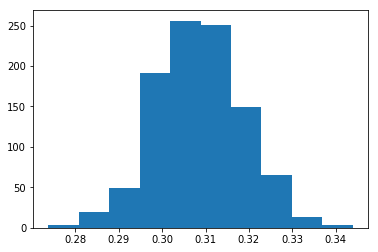

In [15]:
decision_tree_model_accuracies_country = []

#Testar o algoritmo 1000 vezes
for repetition in range(1000):
    (training_inputs_country,
     testing_inputs_country,
     training_classes_country,
     testing_classes_country) = train_test_split(all_inputs_country, all_labels_country, test_size=0.25)

    decision_tree_classifier_country = DecisionTreeClassifier()
    decision_tree_classifier_country.fit(training_inputs_country, training_classes_country)
    classifier_accuracy_country = decision_tree_classifier_country.score(testing_inputs_country, testing_classes_country)
    decision_tree_model_accuracies_country.append(classifier_accuracy_country)

plt.hist(decision_tree_model_accuracies_country)
;

Uma vez que não observamos um real problema de  _overfitting_ não obtemos uma grande vantagem no uso de k-fold cross validation, já que os dados de teste nao iterções tendem a correr para os 31%. Ainda assim decidimos em todos os modelos e algoritmos realizar este teste com cross values a 5 e a 10, dado serem os mais utilizados, e comparamos resultados tentando analisar se mesmo assim teriamos vantagens. Neste caso aqui como é lógico, apesar de termos obetido um agrupamento das accurracies efetivamente nao se obtem grande proveito, dados os valores serem todos muito proximos. 

''

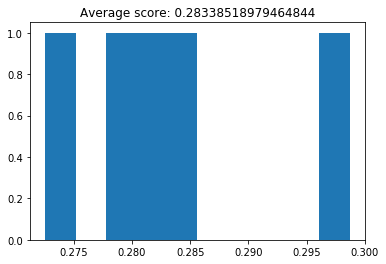

In [14]:
from sklearn.model_selection import cross_val_score

decision_tree_classifier_country = DecisionTreeClassifier(max_depth=1)

cv_scores = cross_val_score(decision_tree_classifier_country, all_inputs_country, all_labels_country, cv=5)
plt.hist(cv_scores)
plt.title('Average score: {}'.format(np.mean(cv_scores)))
;

Portanto tentaremos melhorar o algoritmo tentado alterar outros calssificadores do algoritmo, começamos pelo numero de features e niveis na arvore de pesquisa. Posteriormente após este teste ter sido feito, iremos guardar esses valores de 'max_depth' e 'max_features' resultantes para comparar com 'critirion' e 'spliter'. 

A razão pela qual esta pesquisa se dividiu deve-se ao facto da grande demora que se tem quando se faz uma pesquisa num parameter grid com 4 dimensões com 'max_depth' e 'max_fetures' com muitos valores.

In [15]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

decision_tree_classifier_country = DecisionTreeClassifier()

parameter_grid = {
                  'max_depth': [1, 2, 3, 4, 5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],
                  'max_features': [1, 2, 3, 4, 5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22]}


grid_search = GridSearchCV(decision_tree_classifier_country,
                           param_grid=parameter_grid)

grid_search.fit(all_inputs_country, all_labels_country)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.38419415059116363
Best parameters: {'max_depth': 5, 'max_features': 22}


Assim consideramos 'max_features' com 22 valores dado ser o tamanho das linhas na tabela de input, e 20 niveis diferentes para uma profundidade maxima na arvore para que garantissemos um range alto. Como é de o algoritmo acresce em accuracy em 8% se garantirmos que a sua profuncidade máxima na arvore será de 5 e 22 como 'max_features'.

Como ainda queriamos melhorar a perfomance do algoritmo, dado 38% ser uma accuracy algo baixa, com consulta à documentação do scikit-learn tentamos procurar atributos que puderiam influenciar essa performance. Para isso quisemos ainda testar 'criterion' escolhendo a melhor funcção para avaliar a qualidade de um _split_ na árvore, e ainda o 'splitter' que avalia a estratégia usada para cada _split_. 

In [17]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

decision_tree_classifier_country = DecisionTreeClassifier()

parameter_grid = {'criterion': ['gini', 'entropy'],
                  'splitter': ['best', 'random'],
                  'max_depth': [5],
                  'max_features': [22]}


grid_search = GridSearchCV(decision_tree_classifier_country,
                           param_grid=parameter_grid)

grid_search.fit(all_inputs_country, all_labels_country)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.38892345986309895
Best parameters: {'criterion': 'gini', 'max_depth': 5, 'max_features': 22, 'splitter': 'best'}


Onde é nos apontado 'gini' como melhor algoritmo para avaliar a qualidade de _split_ e 'best' para estrátegia de _split_, no entanto não consideramos estas escolhas revlevantes, mas sim 'max_depth' e 'max_features' dados atributos pouco influenciarem a accuracy. 

Porntanto abaixo vemos os atributos no nosso algoritmos, obetendo assim uma accuracy de 38,8%.

In [18]:
decision_tree_classifier_country = grid_search.best_estimator_
decision_tree_classifier_country

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=5, max_features=22, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [20]:
import sklearn.tree as tree
from sklearn.externals.six import StringIO

with open('decision_tree_country.dot', 'w') as out_file:
    out_file = tree.export_graphviz(decision_tree_classifier_country, out_file=out_file)

![Árvore obtida](decision_tree_country.png)

#### 2. K Vizinho mais Próximo

In [22]:
from sklearn.neighbors import KNeighborsClassifier
    
KNneigh_classifier_country = KNeighborsClassifier(n_neighbors=2)
KNneigh_classifier_country.fit(training_inputs_country, training_classes_country)

KNneigh_classifier_country.score(testing_inputs_country,testing_classes_country)

0.2936784469885515

Para analisar a possibilidade de overfitting corremos o algortimo 1000, usando os seus atributos default vezes registando as várias accuracies atingidas, voltando a executar o teste utilizado no algortimo anterior, e será este o teste a utilizar em todos os algoritmos a frente para avaliação de overfitting.  

Observa-se que os dados oscilam de 30% a 35% aproximadamente mas grand parte das accurcies se afirma nos 32,5%, daí mais uma vez, não se conclua que haja a possibilidade de overfitting.

''

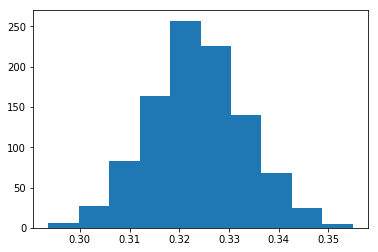

In [22]:
KNneigh_model_accuracies_country = []

#Testar o algoritmo 1000 vezes
for repetition in range(1000):
    (training_inputs_country,
     testing_inputs_country,
     training_classes_country,
     testing_classes_country) = train_test_split(all_inputs_country, all_labels_country, test_size=0.25)

    KNneigh_classifier_country = KNeighborsClassifier()
    KNneigh_classifier_country.fit(training_inputs_country, training_classes_country)
    classifier_accuracy_country = KNneigh_classifier_country.score(testing_inputs_country, testing_classes_country)
    KNneigh_model_accuracies_country.append(classifier_accuracy_country)

plt.hist(KNneigh_model_accuracies_country)
;

Não se obteve qualquer tipo de melhoria com cross validation, testando valores a 5 ou 10, permite efetivamnente singularizar as accuracies obtidas, estabilizando o sistema quando usado com cross value a 5, estando estas estabilizações muito próximas, no entanto.

''

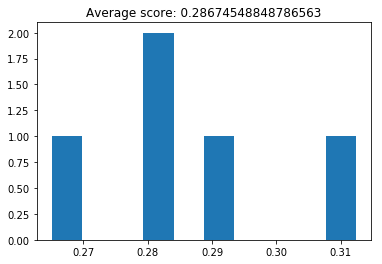

In [23]:
from sklearn.model_selection import cross_val_score

KNneigh_classifier_country = KNeighborsClassifier(n_neighbors=2)

cv_scores = cross_val_score(KNneigh_classifier_country, all_inputs_country, all_labels_country, cv=5)
plt.hist(cv_scores)
plt.title('Average score: {}'.format(np.mean(cv_scores)))
;

Para então se tentar atingir uma accurancy ainda melhor, incialmente tentamos perceber qual seria o numero de vizinhos a usar que mais causaria impacto na avaliacçao do nosso dataset.

In [24]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

KNneigh_classifier_country = KNeighborsClassifier()

parameter_grid = {'n_neighbors':range(2,100)         
                  }

cross_validation = StratifiedKFold(n_splits=5)

grid_search = GridSearchCV(KNneigh_classifier_country,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs_country, all_labels_country)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.39191039203484757
Best parameters: {'n_neighbors': 95}


Conclui-se a assim que 95 vizinhos seriam a melhor escolha, testamos també com um range superior a 100 como limite máximo e mesmo assim se observaram 95 como sendo o melhor valor. 

Esta escolha acresce a nossa accuracy em 10% atingindo já uma accuracy superior à da arvore de decisão. 

Querendo ir mais longe ainda testamos a melhor funçao para pesar, na previsão 'weights', que algoritmo a usar no calculo do vizinho mais próximo 'algorithm' e calculo de distacia a usar, se euclidian ou manhatan 'p'.

In [23]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

KNneigh_classifier_country = KNeighborsClassifier()

parameter_grid = {'n_neighbors':[95],
                  'weights':['uniform','distance'],
                  'algorithm':['ball_tree', 'kd_tree', 'brute'],
                  'p':[1,2]
                  }

cross_validation = StratifiedKFold(n_splits=5)

grid_search = GridSearchCV(KNneigh_classifier_country,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs_country, all_labels_country)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.3948973242065962
Best parameters: {'algorithm': 'brute', 'n_neighbors': 95, 'p': 1, 'weights': 'distance'}


Como se pude comprovar verifica-se que o melhor algoritmo seria de força bruta, pensado pesos por distancia e utilizando calculando a distancia usando distancia de manhattan, no entanto estes valores não necessitariam de ser estriotamente escolhidos visto o aumento de accuracy ser minimo, poderiamos considerar os default, efetivamente o numero de vizinhos acaba por ter o maior impacto.

In [24]:
KNneigh_classifier_country = grid_search.best_estimator_
KNneigh_classifier_country

KNeighborsClassifier(algorithm='brute', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=95, p=1,
                     weights='distance')

#### 3. Rede Neuronal

In [25]:
from sklearn.neural_network import MLPClassifier

neural_network_classifier_country = MLPClassifier(random_state=1,max_iter=200)

neural_network_classifier_country.fit(training_inputs_country, training_classes_country)

neural_network_classifier_country.score(testing_inputs_country, testing_classes_country)

0.4146341463414634

Por si só este algoritmo revela-se logo ser o mais fidedigno sem qualquer tipo de melhoria atribuida, em todas as redes neuronais testadas considerou, random_state a 1 para deste modo incluirmos um fator bias. Neste caso usamos numero de iterações a 200 sendo este o valor defualt do algoritmo.

Tal como nos algoritmos anteriores, nao se observa uma possivbilidade consideravel de overfitting, dado o as accuracies tenderem para um valor a rondar os 42% sem grandes desvios.

''

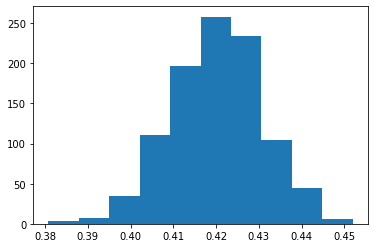

In [9]:
neural_network_model_accuracies_country = []
import warnings
warnings.filterwarnings('ignore')

#Testar o algoritmo 1000 vezes
for repetition in range(1000):
    (training_inputs_country,
     testing_inputs_country,
     training_classes_country,
     testing_classes_country) = train_test_split(all_inputs_country, all_labels_country, test_size=0.25)

    neural_network_classifier_country = MLPClassifier(max_iter=200)
    neural_network_classifier_country.fit(training_inputs_country, training_classes_country)
    classifier_accuracy_country = neural_network_classifier_country.score(testing_inputs_country, testing_classes_country)
    neural_network_model_accuracies_country.append(classifier_accuracy_country)

plt.hist(neural_network_model_accuracies_country)
;

5 foi mau 

''

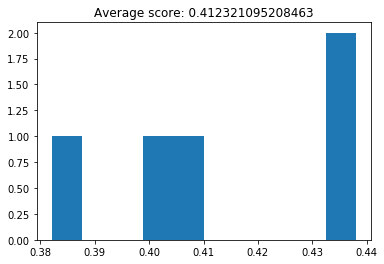

In [36]:
from sklearn.model_selection import cross_val_score

import warnings
warnings.filterwarnings('ignore')

neural_network_classifier_country = MLPClassifier(random_state=1,max_iter=200)

cv_scores = cross_val_score(neural_network_classifier_country, all_inputs_country, all_labels_country, cv=5)
plt.hist(cv_scores)
plt.title('Average score: {}'.format(np.mean(cv_scores)))
;

Incialmente tentamos testar o algoritmo com vários numeros de hidden layers e diversos numeros de neuronios nessass camadas em diferentyes combanições mas obetivemos sempre como resposta a confiração defualt como a melhor, sendo ensta de uman 1 hidden layer com 100 neuronios. Dado tal ter acontecido decidimos procurar maneiras diferentes de aumentar a accuracy da nossa rede neuronal, para isso tentamos perceber qual a melhor função de ativição a usar e qual o melhor _solver_ para otimização de pesos.

In [28]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

import warnings
warnings.filterwarnings('ignore')

neural_network_classifier_country = MLPClassifier(random_state=1,max_iter=200)


parameter_grid = {
                 
                   'activation':['identity', 'logistic', 'tanh', 'relu'], 
                    'solver':['lbfgs', 'sgd', 'adam']
                
                 }

cross_validation = StratifiedKFold(n_splits=5)

grid_search = GridSearchCV(neural_network_classifier_country,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs_country, all_labels_country)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.4378344741754823
Best parameters: {'activation': 'logistic', 'solver': 'adam'}


Não encontram atributos que possam aumentar muito consideravelmente a accuracy já antes obetida, no entanto conseguimos ainda ter um acrescimo médio de 2%, ao utilizarmos a funcção sigmoid para ativação e o gradiente estocástico para otimização de pesos.

In [37]:
neural_network_classifier_country = grid_search.best_estimator_
neural_network_classifier_country

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=7, max_features=36, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

### Classificação por vencedor

In [30]:
# Extract the data in this format from pandas like this:
all_inputs_winner = winner_data_clean[['home_foul','home_corner','home_offside','home_yellow_card','home_red_card','home_penalty','home_fastbreak','home_attempt_3','home_attempt_6','home_attempt_7','home_attempt_8','home_attempt_9','home_attempt_10','home_attempt_11','home_attempt_12','home_attempt_13','home_attempt_14','home_attempt_15','home_attempt_16','home_attempt_17','home_attempt_18','home_attempt_19','away_foul','away_corner','away_offside','away_yellow_card','away_red_card','away_penalty','away_fastbreak','away_attempt_3','away_attempt_6','away_attempt_7','away_attempt_8','away_attempt_9','away_attempt_10','away_attempt_11','away_attempt_12','away_attempt_13','away_attempt_14','away_attempt_15','away_attempt_16','away_attempt_17','away_attempt_18','away_attempt_19']].values

# Extract the class labels
all_labels_winner = winner_data_clean['winner'].values

In [31]:
from sklearn.model_selection import train_test_split

(training_inputs_winner,
 testing_inputs_winner,
 training_classes_winner,
 testing_classes_winner) = train_test_split(all_inputs_winner, all_labels_winner, test_size=0.25, random_state=1)

#### 1. Árvore de Decisão

In [32]:
from sklearn.tree import DecisionTreeClassifier

#Criar Classificador
decision_tree_classifier_winner = DecisionTreeClassifier()

# Treinar ALgoritmo
decision_tree_classifier_winner.fit(training_inputs_winner, training_classes_winner)

# Validar Algoritmo
decision_tree_classifier_winner.score(testing_inputs_winner, testing_classes_winner)

0.4416042309387395

Efetuando o mesmo teste feito à Árvore de decisão acima, voltamos a excluir a hipostese de overfitting, dado os nossos testes convergirem para accuracies de 45.5% oscilando poucas vzes entre 42% e 49% em raras situações.

''

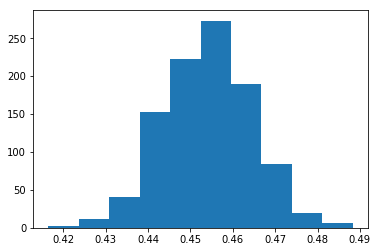

In [25]:
decision_tree_model_accuracies_winner = []

for repetition in range(1000):
    (training_inputs_winner,
     testing_inputs_winner,
     training_classes_winner,
     testing_classes_winner) = train_test_split(all_inputs_winner, all_labels_winner, test_size=0.25)

    decision_tree_classifier_winner = DecisionTreeClassifier()
    decision_tree_classifier_winner.fit(training_inputs_winner, training_classes_winner)
    classifier_accuracy = decision_tree_classifier_winner.score(testing_inputs_winner, testing_classes_winner)
    decision_tree_model_accuracies_winner.append(classifier_accuracy)

plt.hist(decision_tree_model_accuracies_winner)
;

Neste caso decidiu-se considerar, porém, k-cross validation com cross value a 5 dado agrupar os dados de uma excelente forma como é visivel em baixo.

''

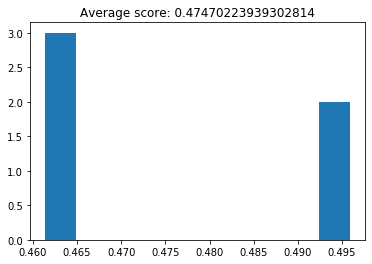

In [30]:
from sklearn.model_selection import cross_val_score

decision_tree_classifier_winner = DecisionTreeClassifier(max_depth=1)

cv_scores = cross_val_score(decision_tree_classifier_winner, all_inputs_winner, all_labels_winner, cv=5)
plt.hist(cv_scores)
plt.title('Average score: {}'.format(np.mean(cv_scores)))
;

Para tuning fizeram-se precisamente os mesmo testesm de grid search que na analáise da àrvore de decisão acima, apensa aqui considerando 'max_features' até 43, dado ser o numeor de linhas do dataset aqui analisado.

In [27]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

decision_tree_classifier_winner = DecisionTreeClassifier()

parameter_grid = {
                  'max_depth': [1, 2, 3, 4, 5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20],
                  'max_features': [1, 2, 3, 4, 5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43]}

cross_validation = StratifiedKFold(n_splits=5)

grid_search = GridSearchCV(decision_tree_classifier_winner,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs_winner, all_labels_winner)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.5257348872102806
Best parameters: {'max_depth': 7, 'max_features': 36}


In [33]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

decision_tree_classifier_winner = DecisionTreeClassifier()

parameter_grid = {'criterion': ['gini', 'entropy'],
                  'splitter': ['best', 'random'],
                  'max_depth': [7],
                  'max_features': [36]}

cross_validation = StratifiedKFold(n_splits=5)

grid_search = GridSearchCV(decision_tree_classifier_winner,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs_winner, all_labels_winner)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.5223194559608311
Best parameters: {'criterion': 'entropy', 'max_depth': 7, 'max_features': 36, 'splitter': 'best'}


In [34]:
decision_tree_classifier_winner = grid_search.best_estimator_
decision_tree_classifier_winner

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=7, max_features=36, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

Observa-se assim um acréscimo de 44% para 52% de accuracy, aproximada, que é obtida quando consideramos o algoritmo com uma árvore com profundidade máxima a 7 com 36 features máximas. Quanto ao 'criterion' e 'splitter' a gerar um empacto quase desprezável.

In [35]:
import sklearn.tree as tree
from sklearn.externals.six import StringIO

with open('decision_tree_classifier_winner.dot', 'w') as out_file:
    out_file = tree.export_graphviz(decision_tree_classifier_winner, out_file=out_file)

![Árvore obtida](decision_tree_classifier_winner.png)

#### 2. K Vizinho mais Próximo

In [41]:
from sklearn.neighbors import KNeighborsClassifier
    
KNneigh_classifier_winner = KNeighborsClassifier(n_neighbors=2)
KNneigh_classifier_winner.fit(training_inputs_winner, training_classes_winner)

KNneigh_classifier_winner.score(testing_inputs_winner,testing_classes_winner)

0.36359629792860293


Mais uma vez, observa-se que os dados oscilam de 41% a 42%, com oscilações desprezáveis sendo overfitting pouco notório.

''

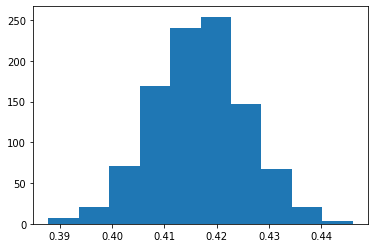

In [42]:
KNneigh_model_accuracies_winner = []

#Testar o algoritmo 1000 vezes
for repetition in range(1000):
    (training_inputs_winner,
     testing_inputs_winner,
     training_classes_winner,
     testing_classes_winner) = train_test_split(all_inputs_winner, all_labels_winner, test_size=0.25)

    KNneigh_classifier_winner = KNeighborsClassifier()
    KNneigh_classifier_winner.fit(training_inputs_winner, training_classes_winner)
    classifier_accuracy_winner = KNneigh_classifier_winner.score(testing_inputs_winner, testing_classes_winner)
    KNneigh_model_accuracies_winner.append(classifier_accuracy_winner)

plt.hist(KNneigh_model_accuracies_winner)
;

Voltando a não haver overfitting, o uso de k-cross fold validation não irá remover overfitting, nem terá uma vantagem tão grande. Observa-se também que com cross value a 5 os dados tem uma melhor agrupação.

''

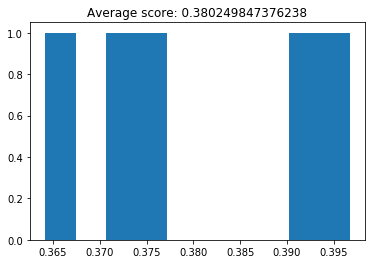

In [34]:
from sklearn.model_selection import cross_val_score

KNneigh_classifier_winner = KNeighborsClassifier(n_neighbors=2)

cv_scores = cross_val_score(KNneigh_classifier_winner, all_inputs_winner, all_labels_winner, cv=5)
plt.hist(cv_scores)
plt.title('Average score: {}'.format(np.mean(cv_scores)))
;

In [35]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

KNneigh_classifier_winner = KNeighborsClassifier()

parameter_grid = {'n_neighbors': range(2,100)
                  }

cross_validation = StratifiedKFold(n_splits=5)

grid_search = GridSearchCV(KNneigh_classifier_winner,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs_winner, all_labels_winner)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.49663893621997257
Best parameters: {'n_neighbors': 75}


In [35]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

KNneigh_classifier_winner = KNeighborsClassifier()

parameter_grid = { 'n_neighbors': [75],
                    'weights':['uniform','distance'],
                  'algorithm':['ball_tree', 'kd_tree', 'brute'],
                  'p':[1,2]
                  }

cross_validation = StratifiedKFold(n_splits=5)

grid_search = GridSearchCV(KNneigh_classifier_winner,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs_winner, all_labels_winner)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.5103071610157909
Best parameters: {'algorithm': 'brute', 'n_neighbors': 75, 'p': 1, 'weights': 'distance'}


Repetindo o mesmo proceso de 'parameter tuning' realizado no algoritmo de k-vizinho mais proximo anterior, obersava um acrescimo de notório na accuracy, com um aumento aproxiamdo de 13%, isto acontece se consideramos 75 como numero de vizinhos, e ainda ao consideramos uma algoritmo de força bruta com pesos por distancia calculadas com distancias de manhattan conseguimos atingir um accuracy de 51% 

In [37]:
KNneigh_classifier_winner = grid_search.best_estimator_
KNneigh_classifier_winner

KNeighborsClassifier(algorithm='brute', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=75, p=1,
                     weights='distance')

#### 3. Rede Neuronal

In [17]:
from sklearn.neural_network import MLPClassifier

neural_network_classifier_winner = MLPClassifier(random_state=1,max_iter=500)

neural_network_classifier_winner.fit(training_inputs_winner, training_classes_winner)

neural_network_classifier_winner.score(testing_inputs_winner, testing_classes_winner)

0.5350374614367562

''

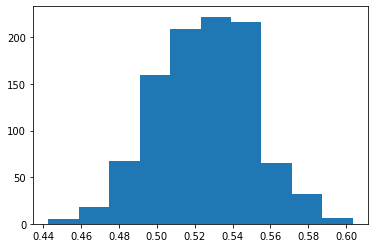

In [12]:
neural_network_model_accuracies_winner = []
import warnings

warnings.filterwarnings('ignore')

#Testar o algoritmo 1000 vezes
for repetition in range(1000):
    (training_inputs_winner,
     testing_inputs_winner,
     training_classes_winner,
     testing_classes_winner) = train_test_split(all_inputs_winner, all_labels_winner, test_size=0.05)

    neural_network_classifier_winner = MLPClassifier(max_iter=500)
    neural_network_classifier_winner.fit(training_inputs_winner, training_classes_winner)
    classifier_accuracy_winner = neural_network_classifier_winner.score(testing_inputs_winner, testing_classes_winner)
    neural_network_model_accuracies_winner.append(classifier_accuracy_winner)

plt.hist(neural_network_model_accuracies_winner)
;

Testes de cross validation com 5 e 10 pioraram 

''

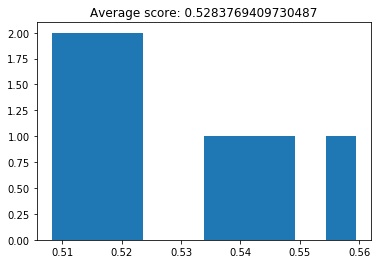

In [21]:
from sklearn.model_selection import cross_val_score
import warnings

warnings.filterwarnings('ignore') 

neural_network_classifier_winner = MLPClassifier(random_state=1,max_iter=500)

cv_scores = cross_val_score(neural_network_classifier_winner, all_inputs_winner, all_labels_winner, cv=10)
plt.hist(cv_scores)
plt.title('Average score: {}'.format(np.mean(cv_scores)))
;

Dado o tempo de pesquisa nos vários atributos da rede neuronal, apenas se conseideram em baixo os atributos quew nos fizerem atingir a maior performance possivel, tendo essa um valor a rondar os 58% de acerto. 

Testamos todas as funções de ativação e de solver para pesos, assim como várias hidden layers com diferentes numeros de neurónios e nao obtivemos qualquer tipo de variação na sua performance, por isso mantave-se o valor default 100 neuronios numa hidden layer.

In [22]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

import warnings

warnings.filterwarnings('ignore') 

neural_network_classifier_winner = MLPClassifier(random_state=1,max_iter=500)

parameter_grid = {
                   'activation':['identity', 'logistic', 'tanh', 'relu'], 
                    'solver':['lbfgs', 'sgd', 'adam']
                
                 }

cross_validation = StratifiedKFold(n_splits=10)

grid_search = GridSearchCV(neural_network_classifier_winner,
                           param_grid=parameter_grid,
                           cv=cross_validation)

grid_search.fit(all_inputs_winner, all_labels_winner)
print('Best score: {}'.format(grid_search.best_score_))
print('Best parameters: {}'.format(grid_search.best_params_))

Best score: 0.5867919121468363
Best parameters: {'activation': 'logistic', 'solver': 'sgd'}


In [23]:
neural_network_classifier_winner = grid_search.best_estimator_
neural_network_classifier_winner

MLPClassifier(activation='logistic', alpha=0.0001, batch_size='auto',
              beta_1=0.9, beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=500,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=1, shuffle=True, solver='sgd',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

### V. Conclusões

TODO

**REFERÊNCIAS**

- [1] BLAH
- ...